# Whole image processing

In [1]:
# General
from glob import glob
from tqdm.notebook import tqdm
import os
import json

# Data Handling
import numpy as np
import pandas as pd

# Plotting
import seaborn as sns
import matplotlib.pyplot as plt

# Image processing
import rasterio
from rasterio.windows import Window
from skimage.draw import polygon2mask
from scipy import ndimage as ndi
from skimage.morphology import remove_small_objects

# Deep Learning
import tensorflow as tf

In [2]:
import resource

In [3]:
cwd = os.getcwd()

if cwd == '/kaggle/working':
    base = "../input/"
else:
    base = "./"

In [4]:
def get_memory():
    with open('/proc/meminfo', 'r') as mem:
        free_memory = 0
        for i in mem:
            sline = i.split()
            if str(sline[0]) in ('MemFree:', 'Buffers:', 'Cached:'):
                free_memory += int(sline[1])
    return free_memory

In [5]:
if base == "./":
    soft, hard = resource.getrlimit(resource.RLIMIT_AS)
    resource.setrlimit(resource.RLIMIT_AS, (get_memory() * 1024 / 4*3, hard))

In [6]:
#     resource.setrlimit(resource.RLIMIT_AS, (-1, hard))

## Load Model

In [7]:
generator = tf.keras.models.load_model(f'{base}hubmap-generator/generator/', compile=False, )

In [8]:
info_df = pd.read_csv(f'{base}hubmap-kidney-segmentation/HuBMAP-20-dataset_information.csv')

## Test image prediction

###  Helper functions

In [9]:
def dice_coef(a, b):
    
    intersection = a & b
    
    int_sum = (a & b).sum()
    
    return int_sum*2/(a.sum()+b.sum())

In [10]:
def get_mask(image_id, window=None, out_shape=None):

    w, h = info_df[info_df.image_file == image_id +
                   '.tiff'][['width_pixels', 'height_pixels']].values.flatten()
    
    mask = np.zeros((w*h,), dtype=bool)

    for i, row in train_df[train_df.id == image_id].iterrows():
        start = row.start
        mask[start] = 1

        for j in range(row.run):
            start += 1
            mask[start] = 1

    mask = mask.reshape(w, h).transpose()
    
    if window:
        min_y, max_y, min_x, max_x = window
        mask = mask[min_y:max_y, min_x:max_x]
    
    if out_shape:
        mask = array_resize(mask, out_shape)
    
    return mask

In [11]:
def array_resize(array, out_shape):
    h, w = out_shape

    row_idx = np.round(np.linspace(0, array.shape[0]-1, h)).astype(int)
    col_idx = np.round(np.linspace(0, array.shape[1]-1, w)).astype(int)

    array = array[row_idx][:,col_idx]
    
    return array

In [12]:
# Load the csv containing the target masks for training images
if base == "./":
    train_df = pd.read_csv('hubmap-kidney-segmentation/train.csv')

    # Unroll encoding column
    temp_df = pd.DataFrame(columns=['id', 'start', 'run'])
    for i, [image_id, encoding] in train_df.iterrows():
        new_section = pd.DataFrame(columns=temp_df.columns)
        encoding = encoding.split()

        start = encoding[::2]
        run = encoding[1::2]
        encoding = np.array(list(zip(start, run))).astype(int)

        new_section['start'] = encoding[:,0]
        new_section['run'] = encoding[:,1]
        new_section['id'] = image_id

        temp_df = temp_df.append(new_section)
    train_df = temp_df
    del temp_df, new_section, run, start

In [13]:
image_data_json = {}

for i, row in info_df.iterrows():
    image_file = row.image_file
    image_id = image_file.split('.')[0]
    
        
    path = glob(f'{base}hubmap-kidney-segmentation/*/{image_id}-anatomical-structure.json')[0]

    with open(path, 'r') as json_file:
        anat_data = json.load(json_file)
        
    path = glob(f'{base}hubmap-kidney-segmentation/train/{image_id}.json')
    
    if path:
        
        with open(path[0], 'r') as json_file:
            glom_data = json.load(json_file)
        
        image_data_json[image_id] = {'anat': anat_data, 'glom': glom_data}
    else:
        image_data_json[image_id] = {'anat': anat_data}


In [14]:
def get_cortex_mask(image_id, size=None, x_anchor=0, y_anchor=0):
    anat_data = image_data_json[image_id]['anat']
    
    w, h = info_df[info_df.image_file == image_id+'.tiff'][['width_pixels', 'height_pixels' ]].values[0]
    
    if size:
        w = h = size
        
    # keep only the cortex information
    cortex_data = [tissue for tissue in anat_data if tissue['properties']
                   ['classification']['name'] == 'Cortex'][0]
    # Extracting polygon vertex
    polygon = np.array(cortex_data['geometry']['coordinates']).reshape(-1, 2)
    if cortex_data['geometry']['type'] == 'Polygon':
        polygon = np.array([polygon])
    else:
        polygon = np.array([polygon]).reshape(-1)
        
    cortex_mask_shape = (256,256)
    
    cortex_mask = np.zeros(cortex_mask_shape, dtype=bool)
    
    for subpolygon in polygon:
        subpolygon = np.array(subpolygon)

        subpolygon[:,0] -= x_anchor
        subpolygon[:,1] -= y_anchor
        
        subpolygon[:,0] = subpolygon[:,0]/w*256
        subpolygon[:,1] = subpolygon[:,1]/h*256        

        cortex_mask = cortex_mask + polygon2mask(cortex_mask_shape, subpolygon[:,::-1])
        
    return cortex_mask

In [15]:
def get_object_sizes(arr):
    selem = ndi.generate_binary_structure(arr.ndim, 2)
    ccs = np.zeros_like(arr, dtype=np.int32)
    ndi.label(arr, selem, output=ccs)
    
    component_sizes = np.bincount(ccs.ravel())
    return component_sizes

In [16]:
def rl_encoder_generator(arr):
    
    start = None
    counter = 0
    for row in arr:
        for col in row:
            counter += 1
            if col:
                if start is None:
                    start = counter
                    run = 1
                else:
                    run += 1
            else:
                if start is not None:
                    yield start, run
                    start = None

In [17]:
# s = 10000
# test  = np.random.choice([True, False], s**2).reshape(s,s)

# with open('rl_test.txt', 'w') as test_file:
#     for start, run in rl_encoder_generator(test.transpose()):
#         test_file.write(f"{start} {run}\n")

### Process Image

In [18]:
n = 20

In [19]:
# Train images
train_file_list = glob(f"{base}hubmap-kidney-segmentation/train/*.tiff")
train_image_id_list = [file.split('/')[-1].split('.')[0] for file in  train_file_list]

test_file_list = glob(f"{base}hubmap-kidney-segmentation/test/*.tiff")
test_image_id_list = [file.split('/')[-1].split('.')[0] for file in  test_file_list]

In [20]:
# image_id_list = ['aaa6a05cc']
# image_id_list = test_image_id_list
image_id_list = train_image_id_list

In [21]:
# size = 22
# total_size = 101
# for i, ax in enumerate(list(range(0,total_size-size-1, size//2))+[total_size-size]):
#     sns.lineplot(x=[ax, ax+size], y = [i,i])

In [22]:
def load_image(src, out_shape, window=None):
    
    args = {'out_shape': out_shape,
            'resampling': rasterio.enums.Resampling.cubic}
    if window:
        args['window'] = Window.from_slices(*window)
    
    h, w = (src.height, src.width)

    if src.count == 3:
        image = src.read(**args).transpose(1,2,0).copy()
    else:
        subdatasets = src.subdatasets
        if len(subdatasets) > 0:
            image = np.zeros(out_shape + (len(subdatasets),), dtype=np.uint8)
            for i, subdataset in enumerate(subdatasets, 0):
                with rasterio.open(subdataset) as layer:
                    image[:,:,i] = layer.read(**args)
        else:
            raise("No subdatasets found")
    
    image = image/255
    return image

/opt/conda/lib/python3.7/site-packages/rasterio/__init__.py:207: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


  0%|          | 0/39 [00:00<?, ?it/s]

Removing small objects


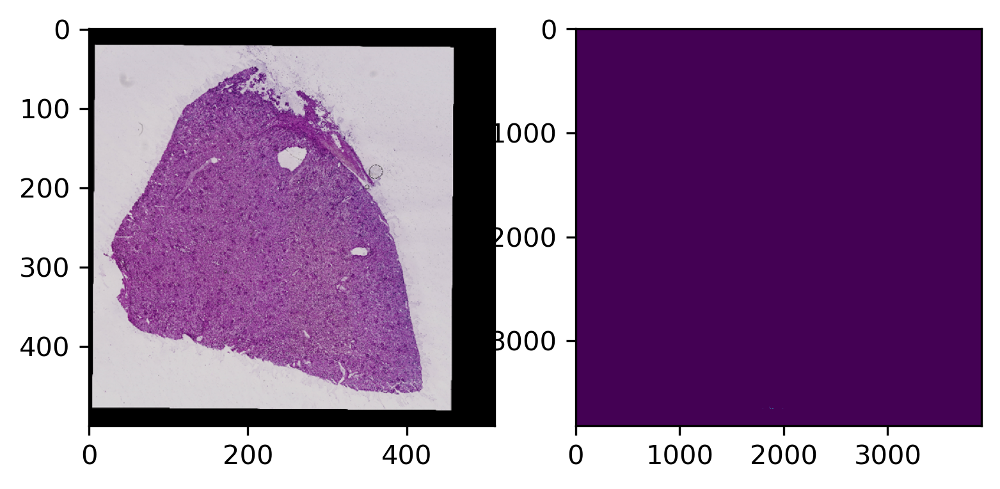

  0%|          | 0/39 [00:00<?, ?it/s]

Removing small objects


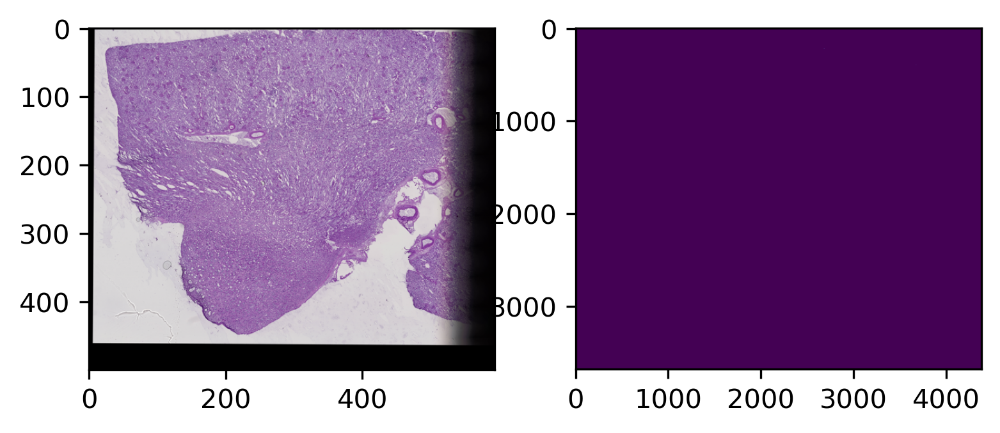

  0%|          | 0/40 [00:00<?, ?it/s]

Removing small objects


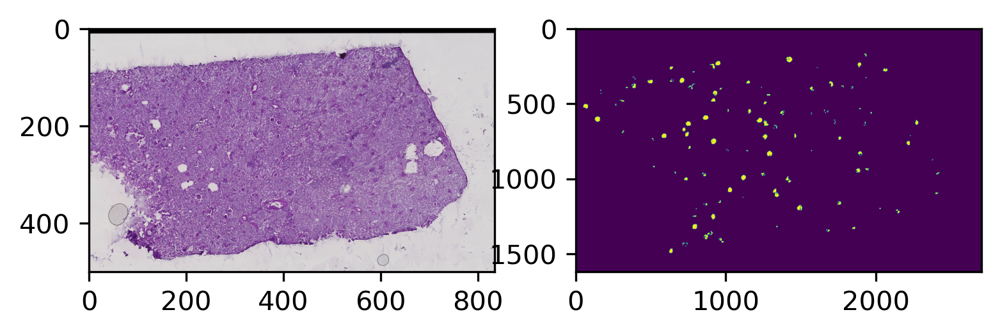

  0%|          | 0/39 [00:00<?, ?it/s]

Removing small objects


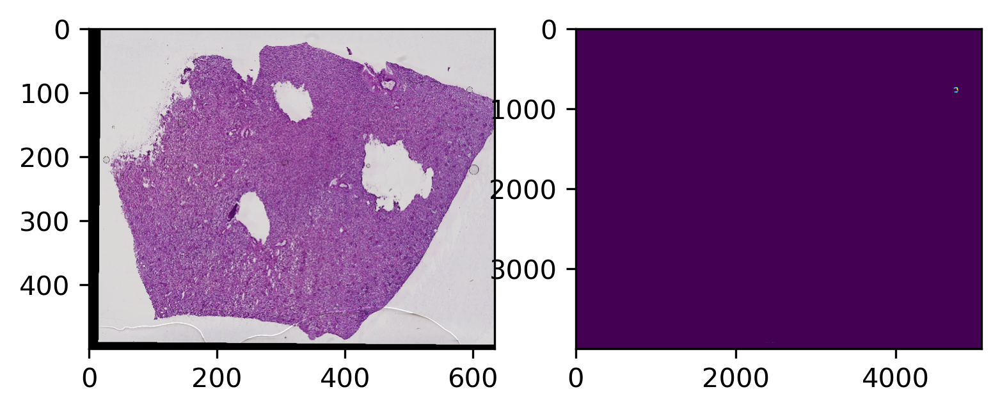

  0%|          | 0/40 [00:00<?, ?it/s]

Removing small objects


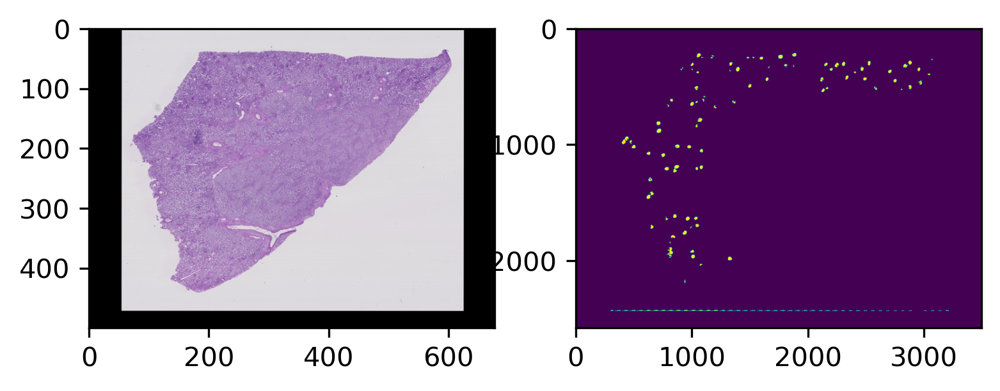

  0%|          | 0/40 [00:00<?, ?it/s]

Removing small objects


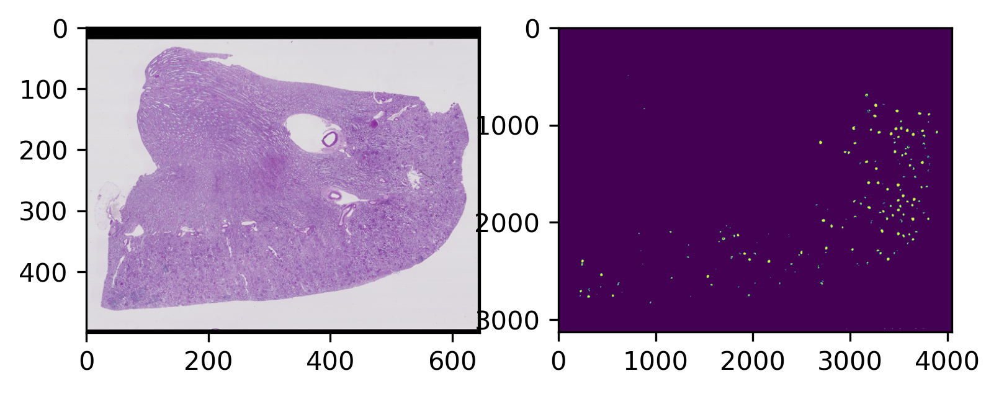

  0%|          | 0/56 [00:00<?, ?it/s]

Removing small objects


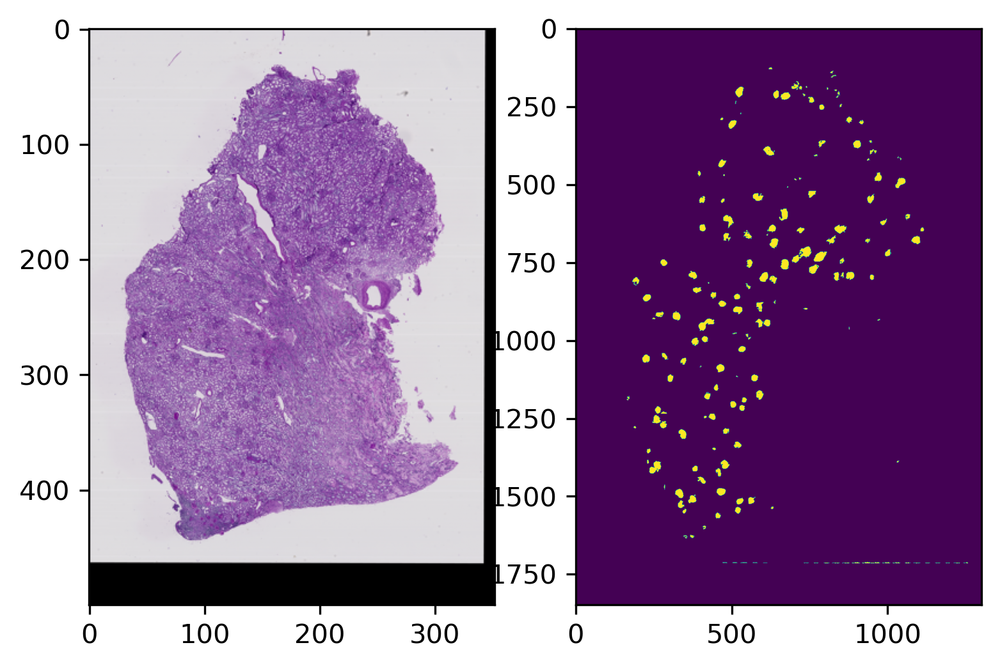

  0%|          | 0/48 [00:00<?, ?it/s]

Removing small objects


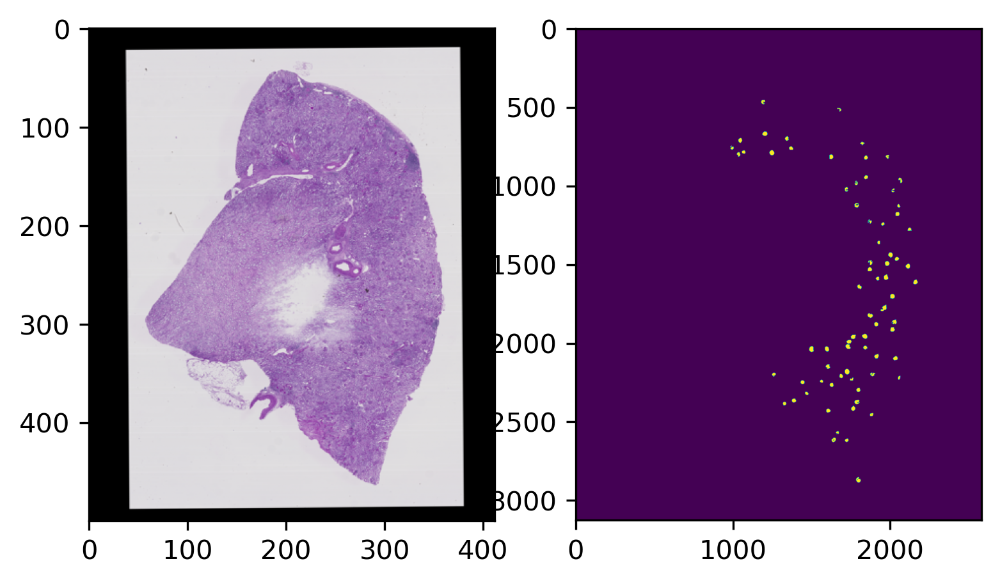

  0%|          | 0/54 [00:00<?, ?it/s]

Removing small objects


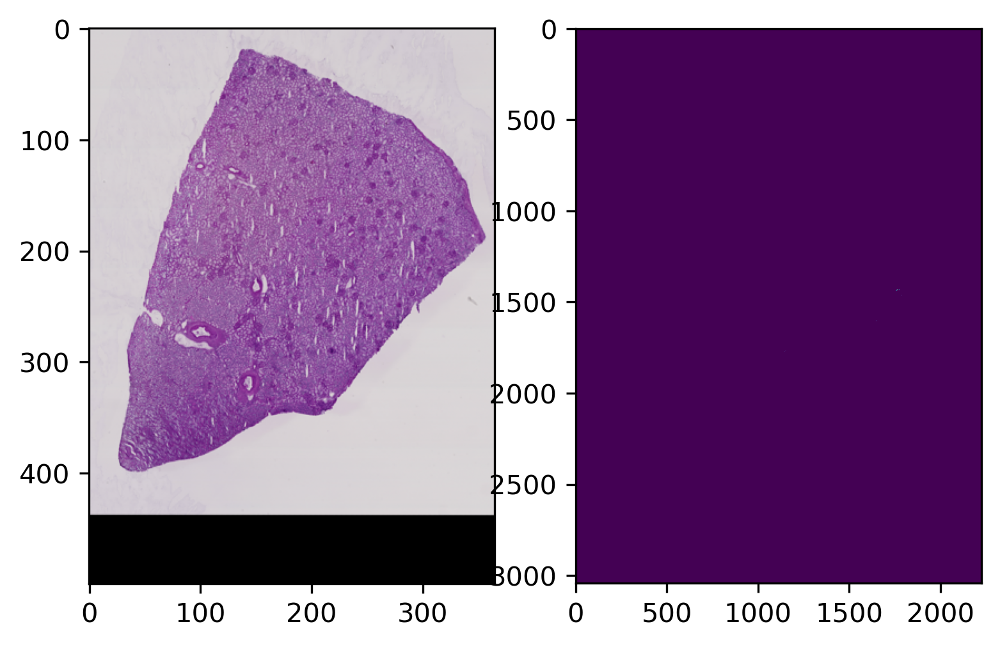

  0%|          | 0/39 [00:00<?, ?it/s]

Removing small objects


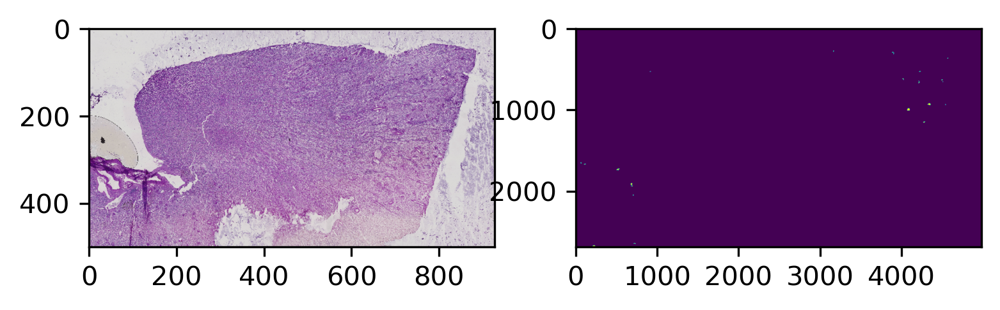

  0%|          | 0/40 [00:00<?, ?it/s]

Removing small objects


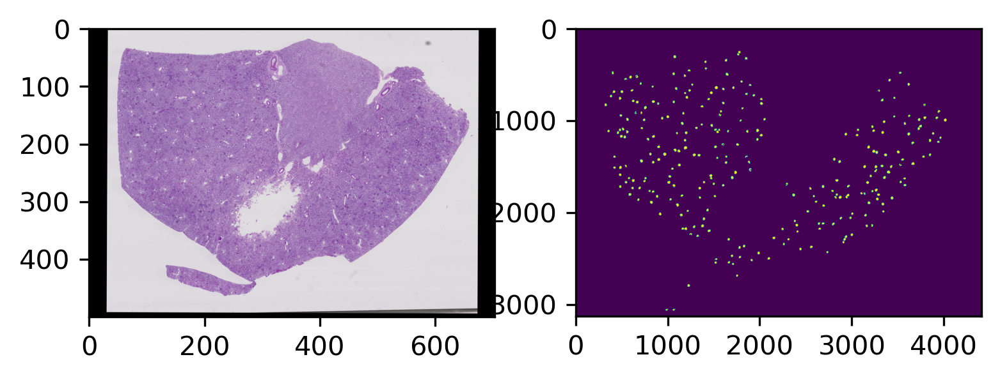

  0%|          | 0/40 [00:00<?, ?it/s]

Removing small objects


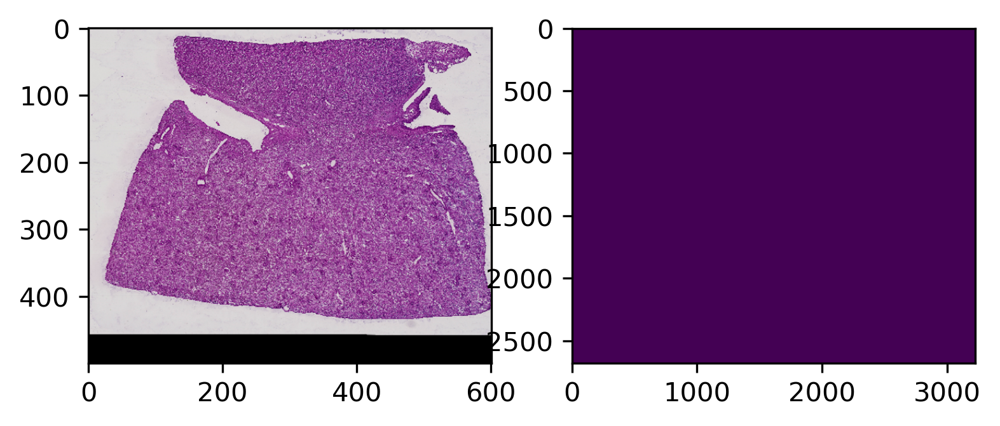

  0%|          | 0/40 [00:00<?, ?it/s]

Removing small objects


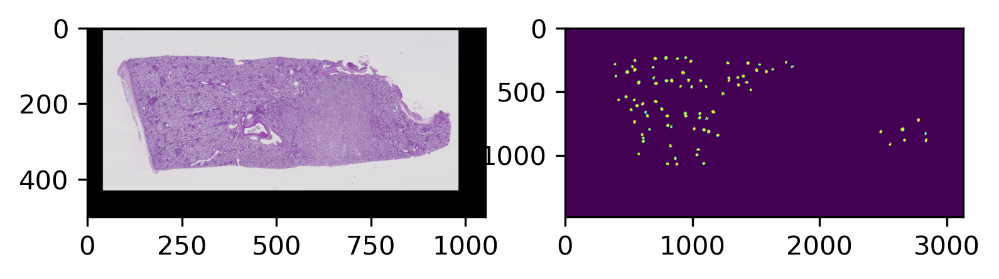

  0%|          | 0/40 [00:00<?, ?it/s]

Removing small objects


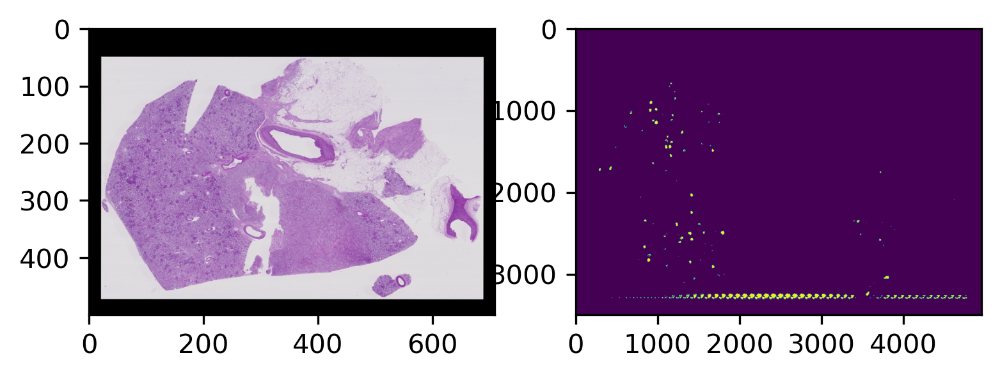

  0%|          | 0/39 [00:00<?, ?it/s]

Removing small objects


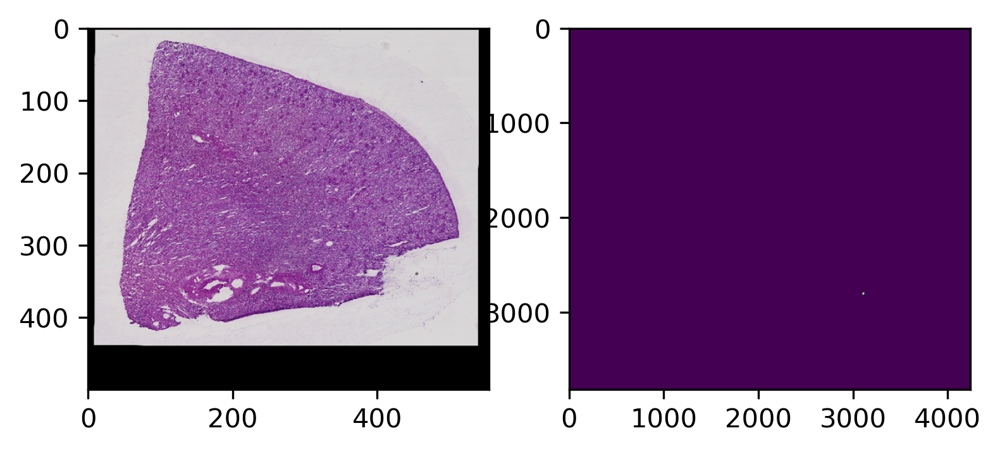

In [23]:
# List that will contain pairs of image_id and rl_encoding
output_list = []

for image_id in image_id_list:

    path = glob(f"{base}hubmap-kidney-segmentation/*/{image_id}.tiff")[0]
    
    with rasterio.open(path) as src:
        
        # Extract width and height of the image
        w = src.width
        h = src.height
        
        # This boolean variable will enable some actions when image belong to train
        is_train = image_id in train_image_id_list
        
        # Plot a thumbnail of the whole image to process

        thumbnail = load_image(src, out_shape=(500, int(w/h*500)))
        
        plt.figure(dpi=300)
        plt.subplot(1,2,1)
        plt.imshow(thumbnail)

        del thumbnail
        
        # Set the size of the window relative to the shortest side of the image
        size = min(h, w)//n
        
        # Generate a set of overlapping anchors for the window
        x_anchor_list = list(range(0,w-size-1, size//2))+[w-size]
        y_anchor_list = list(range(0,h-size-1, size//2))+[h-size]

        
        output_mask = np.zeros((h, w), dtype=bool)

        
        pred_buffer = np.zeros((size, w), dtype=np.half)
        pred_buffer_counter = np.zeros(pred_buffer.shape, dtype=np.uint8)

        for y_anchor in tqdm(y_anchor_list):
            for x_anchor in x_anchor_list:
                
                window = (y_anchor, y_anchor+size), (x_anchor, x_anchor+size)
                sample_image = load_image(src, (256, 256), window=window)

                pred = generator.predict(sample_image[np.newaxis, ...]).reshape(256, 256)

                pred = array_resize(pred, (size, size))

                pred_patch = pred_buffer[:, x_anchor: x_anchor+size]
                counter_patch = pred_buffer_counter[:, x_anchor: x_anchor+size]

                pred_buffer[:, x_anchor: x_anchor + size] = (pred + pred_patch * counter_patch) / (counter_patch+1)
                
                pred_buffer_counter[:, x_anchor: x_anchor+size] = pred_buffer_counter[:, x_anchor: x_anchor+size] + 1
                
            output_mask[y_anchor:y_anchor+size//2] = pred_buffer[:size//2] > 0.75
            
            pred_buffer[:size-size//2] = pred_buffer[size//2:]
            pred_buffer[size//2:] = 0
            
            pred_buffer_counter[:size-size//2] = pred_buffer_counter[size//2:]
            pred_buffer_counter[size//2:] = 0
        
        output_mask[y_anchor+size//2:] = pred_buffer[:size-size//2]    

    del pred, pred_buffer, pred_buffer_counter, pred_patch, counter_patch

    out_shape = (h//10, w//10)

    # Reduce image to be able of removing small objects
    output_mask = array_resize(output_mask, out_shape)

#     if is_train:
#         mask = get_mask(image_id, out_shape=out_shape)
#         mask_objects = get_object_sizes(mask)

#     # Get cortex mask
#     print("Removing off-cortext detections")
#     cortex_mask = get_cortex_mask(image_id)
#     cortex_mask = ~cortex_mask
#     cortex_mask = array_resize(cortex_mask, out_shape)

#     # Delete activations from outside the cortex
#     output_mask[cortex_mask] = 0
#     del cortex_mask
    
    # Remove small objects
    print('Removing small objects')
    output_objects = get_object_sizes(output_mask)[1:]
    if output_objects.size > 0:
        min_size = np.percentile(output_objects, 60)
        output_mask = remove_small_objects(output_mask, min_size=min_size, connectivity=2)
            

    # Plot results for training
#     if is_train:
#         fig = plt.figure(dpi=300)

#         plt.subplot(1, 2, 1)
#         plt.imshow(output_mask)

#         plt.subplot(1, 2, 2)
#         plt.imshow(mask)

#         plt.show()

#         dice = dice_coef(output_mask, mask)

#         print(f"Dice Coefficient {dice:.3f}")

#         del mask
    
    plt.subplot(1, 2, 2)
    plt.imshow(output_mask)
    plt.show()

    if not is_train:
        print('RL econding')
        # Return output mask to its original size
        output_mask = array_resize(output_mask, (h, w))

        output_mask = output_mask.transpose()
        prediction = " ".join([f"{s} {r}" for s, r in rl_encoder_generator(output_mask)])
        
        output_list.append([image_id, prediction])

    del output_mask



In [24]:
output_df = pd.DataFrame(output_list, columns=['id', 'predicted'])
output_df = output_df.set_index('id')

In [25]:
output_df.to_csv('submission.csv')

In [26]:
# # Determine optimal thresholds
# threshold_dice = []
# for t1 in np.linspace(0.2,0.99, 20):
#     bool_output_mask = output_mask > t1

# #     plt.figure(dpi=300)
# #     plt.imshow(bool_output_mask)
# #     plt.colorbar()
# #     plt.show()
#     output_objects = get_object_sizes(bool_output_mask)[1:]
        
#     for t2 in np.linspace(25, 90, 20):

#         min_size = np.percentile(output_objects, t2)

#         # Remove small objects
#         denoised_output_mask = remove_small_objects(bool_output_mask, min_size=min_size, connectivity=2)

#         dice = dice_coef(denoised_output_mask, mask)

#         threshold_dice.append([t1, t2, dice])


# threshold_dice = pd.DataFrame(threshold_dice, columns=['t1', 't2', 'dice'])

# sns.scatterplot(data=threshold_dice, x='t1', y='t2', hue='dice')
# plt.legend( bbox_to_anchor=(1.05, 1))
# plt.show()

# threshold_dice.max()